<a href="https://colab.research.google.com/github/ahatesham02/Bangla-Image-Captioning/blob/main/Bornon_image_captioning_with_Attention_%2B_BiGRU_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##New

In [1]:


import string
import keras
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd 
from PIL import Image
import pickle
from collections import Counter
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [3]:
import zipfile
exfile= '/content/drive/MyDrive/Image Caption Generation /Bornon/Bornon Images-20221222T175856Z-001.zip'
zip_ref = zipfile.ZipFile(exfile, 'r')
zip_ref.extractall()
zip_ref.close()

In [5]:
from os import listdir

image_dir = '/content/Bornon Images'
images = listdir(image_dir)

In [6]:
len(images)

4106

In [7]:
train_captions = load(open('/content/drive/MyDrive/Image Caption Generation /Bornon/bornon_captions.pkl', 'rb'))
img_name_vector = load(open('/content/drive/MyDrive/Image Caption Generation /Bornon/bornon_img_names.pkl', 'rb'))

In [8]:
df = pd.DataFrame(list(zip(img_name_vector, train_captions)),
               columns =['filename', 'captions'])
df.head(10)

,filename,captions
0,/content/Bornon Images/1.jpg,<start> একটি পার্কে একটি লেক আছে <end>
1,/content/Bornon Images/1.jpg,<start> লেকের উপর একটি ব্রীজ আছে <end>
2,/content/Bornon Images/1.jpg,<start> গাছপালায় ঘেরা এই পার্কটি খুবই মনমু...
3,/content/Bornon Images/1.jpg,<start> লেকের উপর একটি ব্রীজ আছে <end>
4,/content/Bornon Images/1.jpg,<start> পানির উপর আকাশের প্রতিচ্ছবি দেখা যা...
5,/content/Bornon Images/2.jpg,<start> একজন মানুষ মাথায় খড় নিয়ে হেটে যা...
6,/content/Bornon Images/2.jpg,<start> একজন মানুষ ও দু টি খড়ের স্তূপ দেখা...
7,/content/Bornon Images/2.jpg,<start> লুঙ্গি পড়া একজন মানুষ খড়ের উপর হে...
8,/content/Bornon Images/2.jpg,<start> দুটি খড়ের স্তূপের পেছনে অনেক গাছপা...
9,/content/Bornon Images/2.jpg,<start> অনেক গাছপালার সামনে দুটি খড়ের স্তূ...


In [ ]:
filt =['<start>','<unk>','<end>'] 

In [9]:
grouped_df = df.groupby('filename')['captions'].apply(list).reset_index(name='captions')
grouped_df['captions'] = [[caption.split() for caption in captions] for captions in grouped_df['captions']]

In [10]:
grouped_df['captions'][4]

[['<start>', 'একটি', 'লোক', 'ঝর্ণার', 'সামনে', 'দারিয়ে', 'আছে', '<end>'],
 ['<start>',
  'একটি',
  'লোক',
  'পাহাড়ের',
  'সামনে',
  'দারিয়ে',
  'আছে',
  'এবং',
  'পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে',
  '<end>'],
 ['<start>',
  'পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে',
  'ঝর্ণার',
  'আকারে',
  'এবং',
  'একটি',
  'লোক',
  'দারিয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  'একজন',
  'লোক',
  'পাহাড়ের',
  'সামনে',
  'দারিয়ে',
  'ঝর্ণা',
  'দেখছে',
  '<end>'],
 ['<start>', 'একজন', 'লোক', 'ঝর্ণার', 'দিকে', 'তাকিয়ে', 'আছে', '<end>']]

In [11]:
grouped_df.head()

,filename,captions
0,/content/Bornon Images/1.jpg,"[[<start>, একটি, পার্কে, একটি, লেক, আছে, <end>..."
1,/content/Bornon Images/10.jpg,"[[<start>, একটি, লোহার, জালি, দেখা, যাচ্ছে, <e..."
2,/content/Bornon Images/100.jpg,"[[<start>, উরন্ত, একটি, পাখি, <end>], [<start>..."
3,/content/Bornon Images/1000.jpg,"[[<start>, একটি, বিড়াল, <end>], [<start>, বিড়..."
4,/content/Bornon Images/1001.jpg,"[[<start>, একটি, লোক, ঝর্ণার, সামনে, দারিয়ে, আ..."


In [12]:
for i, row in grouped_df.iterrows():
    captions = row['captions']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions'] = captions

In [13]:
grouped_df['captions'][4]

[['একটি', 'লোক', 'ঝর্ণার', 'সামনে', 'দারিয়ে', 'আছে'],
 ['একটি',
  'লোক',
  'পাহাড়ের',
  'সামনে',
  'দারিয়ে',
  'আছে',
  'এবং',
  'পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে'],
 ['পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে',
  'ঝর্ণার',
  'আকারে',
  'এবং',
  'একটি',
  'লোক',
  'দারিয়ে',
  'আছে'],
 ['একজন', 'লোক', 'পাহাড়ের', 'সামনে', 'দারিয়ে', 'ঝর্ণা', 'দেখছে'],
 ['একজন', 'লোক', 'ঝর্ণার', 'দিকে', 'তাকিয়ে', 'আছে']]

In [14]:
grouped_df.captions[6]

[['পাহাড়ের', 'উপর', 'অনেক', 'গুল', 'গাছ', 'আছে'],
 ['পাহাড়',
  'থেকে',
  'অনেক',
  'দূরে',
  'কুয়াশার',
  'মধ্যে',
  'আরও',
  'পাহাড়',
  'রয়েছে'],
 ['পাহাড়ের',
  'উপর',
  'অনেক',
  'গুলো',
  'গাছ',
  'আছে',
  'এবং',
  'গাছ',
  'গুলোর',
  'পিছনে',
  'কুয়াশা'],
 ['কুয়াশার', 'মধ্যে', 'অনেক', 'পাহাড়ের', 'সারি', 'রয়েছে'],
 ['পাহাড়ের', 'উপরের', 'গাছের', 'পাতা', 'গুলো', 'সবুজ']]

In [15]:
train_data, test_data, train_caption, test_caption = train_test_split(img_name_vector, train_captions, test_size = 0.1, random_state = 42)

In [115]:
len(train_data)

18395

In [116]:
len(test_data)

2044

In [16]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input

In [17]:
image_model = ResNet50(include_top=False,weights='imagenet')
new_input = image_model.input 
hidden_layer = image_model.layers[-1].output  
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

94765736/94765736 [==============================] - 5s 0us/step


In [18]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [38]:
preprocessed_image = []
IMAGE_SHAPE = (224, 224)

In [39]:
for img in train_data[0:5] :
    img = tf.io.read_file(img, name=None)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    preprocessed_image.append(img)

Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)


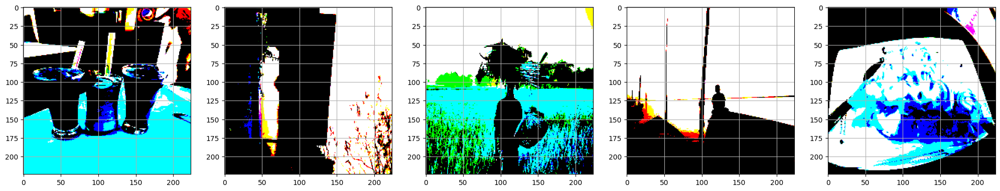

In [40]:
# checking first five images post preprocessing
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)
for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

Shape after resize : (224, 224, 3)


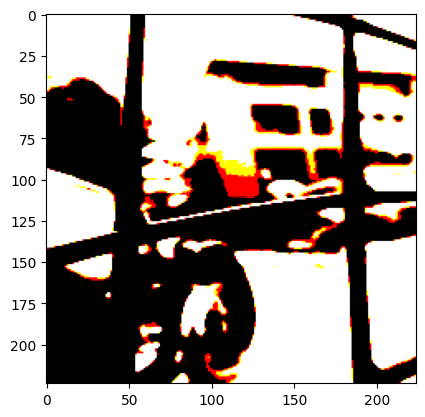

In [41]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = preprocess_input(img)
  return img, image_path

img1,img1_path = load_images("/content/Bornon Images/10.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Tokenizer and Vocabulary

In [42]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_caption)
train_seqs = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_caption)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [43]:
vocab_size = len(tokenizer.index_word)+1

In [44]:
vocab_size

5568

In [45]:
train_caption[:3]

['<start>    একটি কোল্ড কফির রং হলুদ   <end>',
 '<start>    একটি সাইনবোর্ডে লেকের সতর্কীকরণ বিজ্ঞপ্তি দেওয়া আছে   <end>',
 '<start>    ফসলের মাঠে কৃষক কে দেখা যাচ্ছে   <end>']

In [46]:
train_seqs[:3]

[[2, 4, 2527, 1277, 103, 64, 3],
 [2, 4, 1427, 472, 2528, 3412, 840, 5, 3],
 [2, 775, 174, 727, 679, 7, 6, 3]]

In [47]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'একটি',
 5: 'আছে',
 6: 'যাচ্ছে',
 7: 'দেখা',
 8: 'কিছু',
 9: 'একজন',
 10: 'মানুষ',
 11: 'রয়েছে',
 12: 'ছবি',
 13: 'সাদা',
 14: 'বসে',
 15: 'ও',
 16: 'খাবার',
 17: 'উপর',
 18: 'অনেক',
 19: 'এবং',
 20: 'গাছ',
 21: 'বাটিতে',
 22: 'ফুল',
 23: 'দুটি',
 24: 'রঙের',
 25: 'সবুজ',
 26: 'পাশে',
 27: 'এর',
 28: 'কুকুর',
 29: 'গাছপালা',
 30: 'রাখা',
 31: 'লাল',
 32: 'কালো',
 33: 'লোক',
 34: 'পাখি',
 35: 'নৌকা',
 36: 'অনেকগুলো',
 37: 'পাতা',
 38: 'আকাশ',
 39: 'গাছের',
 40: 'আকাশে',
 41: 'নীল',
 42: 'প্লেটে',
 43: 'দাঁড়িয়ে',
 44: 'দালান',
 45: 'দারিয়ে',
 46: 'দৃশ্যমান',
 47: 'সামনে',
 48: 'বিড়াল',
 49: 'বাটি',
 50: 'মধ্যে',
 51: 'দুইটি',
 52: 'রাস্তার',
 53: 'নদীর',
 54: 'উপরে',
 55: 'দিয়ে',
 56: 'ছেলে',
 57: 'কয়েকটি',
 58: 'রাস্তা',
 59: 'রয়েছে',
 60: 'প্লেট',
 61: 'রাস্তায়',
 62: 'প্লেটের',
 63: 'করা',
 64: 'হলুদ',
 65: 'ওপর',
 66: 'করছে',
 67: 'শিশু',
 68: 'মেঘ',
 69: 'তিনটি',
 70: 'ছোট',
 71: 'দালানের',
 72: 'নিচে',
 73: 'দূরে',
 74: 'টেবিলের',
 75: 

In [48]:
# Pad each vector to the max_length of the captions  store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)
print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(18395, 23)


In [49]:
cap_vector

array([[   2,    4, 2527, ...,    0,    0,    0],
       [   2,    4, 1427, ...,    0,    0,    0],
       [   2,  775,  174, ...,    0,    0,    0],
       ...,
       [   2,    4,  868, ...,    0,    0,    0],
       [   2,    4,  624, ...,    0,    0,    0],
       [   2,   35,   51, ...,    0,    0,    0]], dtype=int32)

## Creating Dataset

In [50]:
# Map each image full path to the function, in order to preprocess the image
training_list = sorted(set(train_data))
New_Img = tf.data.Dataset.from_tensor_slices(training_list)
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
New_Img = New_Img.batch(64, drop_remainder=False)

In [51]:
path_train, path_test, caption_train, caption_test = train_test_split(train_data, cap_vector, test_size = 0.1, random_state = 42)

In [52]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 16555
Testing data for images: 1840
Training data for Captions: 16555
Testing data for Captions: 1840


In [53]:
from tqdm import tqdm

In [54]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [55]:
# extract features from each image in the dataset
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 64/64 [00:18<00:00,  3.43it/s]


In [56]:
batch_features

<tf.Tensor: shape=(56, 7, 7, 2048), dtype=float32, numpy=
array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          4.54157162e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          5.90652561e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         

In [57]:
batch_features_flattened

<tf.Tensor: shape=(56, 49, 2048), dtype=float32, numpy=
array([[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        ...,
        [0.0000000e+00, 3.1912310e+00, 0.0000000e+00, ...,
         0.0000000e+00, 2.5829935e-01, 0.0000000e+00],
        [0.0000000e+00, 3.2578123e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 7.6247768e+00, 0.0000000e+00]],

       [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
         0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
        [0.000000

In [58]:
batch_feat.shape

TensorShape([49, 2048])

In [59]:
img_features 

{'/content/Bornon Images/1.jpg': array([[0.       , 6.8307953, 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        ...,
        [0.       , 0.       , 0.       , ..., 5.668069 , 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 4.2779546, 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.5705079, 0.       ,
         0.       ]], dtype=float32),
 '/content/Bornon Images/10.jpg': array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [1.3948994 , 0.5629108 , 0.        , ..., 8.562688  , 1.

In [60]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [61]:
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):
        
    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)
    
     
    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [62]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [63]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 7*7, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 49, 2048)
(64, 23)


In [65]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
train_num_steps = len(path_train) // BATCH_SIZE 
test_num_steps = len(path_test) // BATCH_SIZE 
EPOCHS = 20
max_length = 23
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [66]:
vocab_size

5568

In [67]:
feature_shape

2048

In [68]:
attention_feature_shape

49

## CNN Encoder

In [69]:
from keras.utils.vis_utils import plot_model

In [70]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [71]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation
        
    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [72]:
encoder=Encoder(embedding_dim)

## Attention Model

In [73]:
class Attention(Model):
    def __init__(self, units):
        super(Attention, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units) 
        self.W2 = tf.keras.layers.Dense(units) 
        self.V = tf.keras.layers.Dense(1) 
        

    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))  
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1) 
        context_vector = attention_weights * features 
        context_vector = tf.reduce_sum(context_vector, axis=1)  
        return context_vector, attention_weights

In [74]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state,_ = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [75]:
class Decoder2(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder2, self).__init__()
        self.units=units
        self.attention = Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer
        

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state_f,state_b = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        #print(output.shape)
        #print(state_f.shape)
        #print(state_b.shape)
        state = tf.keras.layers.Add()([state_f, state_b])
        #print(state.shape)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [76]:
decoder=Decoder2(embedding_dim, units, vocab_size)

In [77]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim

Feature shape from Encoder: (64, 49, 256)
Predcitions shape from Decoder: (64, 5568)
Attention weights shape from Decoder: (64, 49, 1)


In [78]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [79]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape
    
    return tf.reduce_mean(loss_)

In [80]:
checkpoint_path = "/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [81]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [82]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape:
        
        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions) 
          dec_input = tf.expand_dims(target[:, r], 1)  

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [83]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)
        dec_input = tf.expand_dims(target[: , r], 1)
    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars) 
    optimizer.apply_gradients(zip(grad, trainable_vars))                      
    return loss, avg_loss

In [84]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [85]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps   
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|          | 0/30 [00:00<?, ?it/s]

For epoch: 1, the train loss is 1.235, & test loss is 1.060
Time taken for 1 epoch 165.90876364707947 sec

Test loss has been reduced from 100.000 to 1.060


  3%|▎         | 1/30 [02:46<1:20:21, 166.27s/it]

For epoch: 2, the train loss is 0.900, & test loss is 0.833
Time taken for 1 epoch 26.037723541259766 sec

Test loss has been reduced from 1.060 to 0.833


  7%|▋         | 2/30 [03:12<39:10, 83.95s/it]   

For epoch: 3, the train loss is 0.728, & test loss is 0.678
Time taken for 1 epoch 24.880730628967285 sec

Test loss has been reduced from 0.833 to 0.678


 10%|█         | 3/30 [03:37<25:42, 57.12s/it]

For epoch: 4, the train loss is 0.607, & test loss is 0.573
Time taken for 1 epoch 24.98656415939331 sec

Test loss has been reduced from 0.678 to 0.573


 13%|█▎        | 4/30 [04:03<19:18, 44.56s/it]

For epoch: 5, the train loss is 0.520, & test loss is 0.494
Time taken for 1 epoch 24.511706829071045 sec

Test loss has been reduced from 0.573 to 0.494


 17%|█▋        | 5/30 [04:27<15:35, 37.43s/it]

For epoch: 6, the train loss is 0.453, & test loss is 0.429
Time taken for 1 epoch 24.73624587059021 sec

Test loss has been reduced from 0.494 to 0.429


 20%|██        | 6/30 [04:52<13:17, 33.22s/it]

For epoch: 7, the train loss is 0.401, & test loss is 0.380
Time taken for 1 epoch 24.855802297592163 sec

Test loss has been reduced from 0.429 to 0.380


 23%|██▎       | 7/30 [05:18<11:43, 30.59s/it]

For epoch: 8, the train loss is 0.358, & test loss is 0.335
Time taken for 1 epoch 24.471208572387695 sec

Test loss has been reduced from 0.380 to 0.335


 27%|██▋       | 8/30 [05:42<10:32, 28.75s/it]

For epoch: 9, the train loss is 0.319, & test loss is 0.302
Time taken for 1 epoch 24.505188703536987 sec

Test loss has been reduced from 0.335 to 0.302


 30%|███       | 9/30 [06:07<09:38, 27.52s/it]

For epoch: 10, the train loss is 0.288, & test loss is 0.279
Time taken for 1 epoch 24.306843280792236 sec

Test loss has been reduced from 0.302 to 0.279


 33%|███▎      | 10/30 [06:32<08:52, 26.64s/it]

For epoch: 11, the train loss is 0.260, & test loss is 0.249
Time taken for 1 epoch 24.39228868484497 sec

Test loss has been reduced from 0.279 to 0.249


 37%|███▋      | 11/30 [06:57<08:15, 26.06s/it]

For epoch: 12, the train loss is 0.235, & test loss is 0.229
Time taken for 1 epoch 24.756311655044556 sec

Test loss has been reduced from 0.249 to 0.229


 40%|████      | 12/30 [07:22<07:43, 25.77s/it]

For epoch: 13, the train loss is 0.215, & test loss is 0.207
Time taken for 1 epoch 24.46734857559204 sec

Test loss has been reduced from 0.229 to 0.207


 43%|████▎     | 13/30 [07:47<07:13, 25.48s/it]

For epoch: 14, the train loss is 0.198, & test loss is 0.195
Time taken for 1 epoch 24.45724058151245 sec

Test loss has been reduced from 0.207 to 0.195


 47%|████▋     | 14/30 [08:11<06:44, 25.28s/it]

For epoch: 15, the train loss is 0.183, & test loss is 0.177
Time taken for 1 epoch 24.61686658859253 sec

Test loss has been reduced from 0.195 to 0.177


 50%|█████     | 15/30 [08:36<06:17, 25.18s/it]

For epoch: 16, the train loss is 0.174, & test loss is 0.167
Time taken for 1 epoch 24.22524380683899 sec

Test loss has been reduced from 0.177 to 0.167


 53%|█████▎    | 16/30 [09:01<05:49, 25.00s/it]

For epoch: 17, the train loss is 0.162, & test loss is 0.154
Time taken for 1 epoch 24.340169668197632 sec

Test loss has been reduced from 0.167 to 0.154


 57%|█████▋    | 17/30 [09:26<05:23, 24.89s/it]

For epoch: 18, the train loss is 0.157, & test loss is 0.149
Time taken for 1 epoch 24.67635464668274 sec

Test loss has been reduced from 0.154 to 0.149


 60%|██████    | 18/30 [09:51<04:59, 24.94s/it]

For epoch: 19, the train loss is 0.150, & test loss is 0.148
Time taken for 1 epoch 24.260859489440918 sec

Test loss has been reduced from 0.149 to 0.148


 63%|██████▎   | 19/30 [10:15<04:33, 24.83s/it]

For epoch: 20, the train loss is 0.146, & test loss is 0.137
Time taken for 1 epoch 24.43617272377014 sec

Test loss has been reduced from 0.148 to 0.137


 70%|███████   | 21/30 [11:04<03:42, 24.70s/it]

For epoch: 21, the train loss is 0.139, & test loss is 0.141
Time taken for 1 epoch 24.438420295715332 sec



 73%|███████▎  | 22/30 [11:29<03:16, 24.54s/it]

For epoch: 22, the train loss is 0.137, & test loss is 0.138
Time taken for 1 epoch 24.158145427703857 sec

For epoch: 23, the train loss is 0.134, & test loss is 0.124
Time taken for 1 epoch 24.180100202560425 sec

Test loss has been reduced from 0.137 to 0.124


 80%|████████  | 24/30 [12:17<02:26, 24.47s/it]

For epoch: 24, the train loss is 0.129, & test loss is 0.125
Time taken for 1 epoch 24.353856563568115 sec

For epoch: 25, the train loss is 0.126, & test loss is 0.121
Time taken for 1 epoch 24.35921335220337 sec

Test loss has been reduced from 0.124 to 0.121


 87%|████████▋ | 26/30 [13:06<01:37, 24.44s/it]

For epoch: 26, the train loss is 0.126, & test loss is 0.128
Time taken for 1 epoch 24.20199728012085 sec



 90%|█████████ | 27/30 [13:31<01:13, 24.45s/it]

For epoch: 27, the train loss is 0.123, & test loss is 0.122
Time taken for 1 epoch 24.474867820739746 sec

For epoch: 28, the train loss is 0.121, & test loss is 0.120
Time taken for 1 epoch 24.10191535949707 sec

Test loss has been reduced from 0.121 to 0.120


 97%|█████████▋| 29/30 [14:19<00:24, 24.36s/it]

For epoch: 29, the train loss is 0.119, & test loss is 0.120
Time taken for 1 epoch 24.172892570495605 sec

For epoch: 30, the train loss is 0.118, & test loss is 0.116
Time taken for 1 epoch 24.212791442871094 sec

Test loss has been reduced from 0.120 to 0.116


100%|██████████| 30/30 [14:44<00:00, 29.48s/it]


In [86]:
ckpt_manager.checkpoints

['/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-20',
 '/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-21',
 '/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-22',
 '/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-23',
 '/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-24']

In [88]:
ckpt.restore('/content/drive/MyDrive/Image Caption Generation /Bornon/Models/Attention + Bigru/ckpt-24')

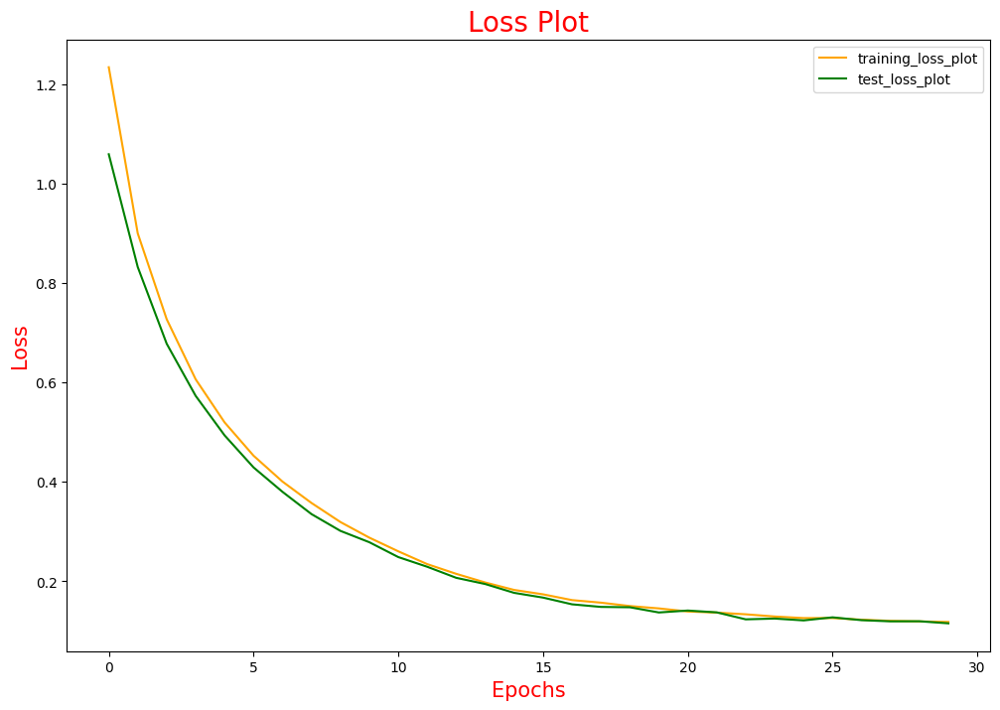

In [89]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [90]:
attention_feature_shape

49

In [91]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
font_path = '/content/drive/MyDrive/Image Caption Generation /SolaimanLipi_20-04-07.ttf'
prop = fm.FontProperties(fname=font_path)

In [92]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0) 
    img_tensor_val = image_features_extract_model(temp_input) 
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val) 

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden) 
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy() 
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [93]:
def plot_attention_map(caption, weights, image) :

  fig = plt.figure(figsize = (12, 12))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(len(caption)) :
    weights_img = np.reshape(weights[cap], (7,7))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 24, color = 'red',fontproperties=prop)

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gray', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [94]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [95]:
image_test = path_test.copy()

In [96]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

In [97]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [98]:
from nltk.translate.meteor_score import meteor_score

In [99]:
encoder.save_weights('content/outputs_encoder')
decoder.save_weights('.content/outputs_decoder')

In [100]:
path_test

['/content/Bornon Images/3833.jpg',
 '/content/Bornon Images/2454.jpg',
 '/content/Bornon Images/3691.jpg',
 '/content/Bornon Images/2651.jpg',
 '/content/Bornon Images/3936.jpg',
 '/content/Bornon Images/128.jpg',
 '/content/Bornon Images/399.jpg',
 '/content/Bornon Images/344.jpg',
 '/content/Bornon Images/2028.jpg',
 '/content/Bornon Images/4038.jpg',
 '/content/Bornon Images/2230.jpg',
 '/content/Bornon Images/3363.jpg',
 '/content/Bornon Images/3006.jpg',
 '/content/Bornon Images/2246.jpg',
 '/content/Bornon Images/3180.jpg',
 '/content/Bornon Images/1184.jpg',
 '/content/Bornon Images/3652.jpg',
 '/content/Bornon Images/3272.jpg',
 '/content/Bornon Images/688.jpg',
 '/content/Bornon Images/2186.jpg',
 '/content/Bornon Images/369.jpg',
 '/content/Bornon Images/2121.jpg',
 '/content/Bornon Images/3868.jpg',
 '/content/Bornon Images/1641.jpg',
 '/content/Bornon Images/1702.jpg',
 '/content/Bornon Images/2834.jpg',
 '/content/Bornon Images/531.jpg',
 '/content/Bornon Images/1188.jpg'

BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 57.571973
Meteor Score: 0.981481
Real Caption: অনেক গাছপালা আছে
Prediction Caption: অনেক গাছপালা আছে


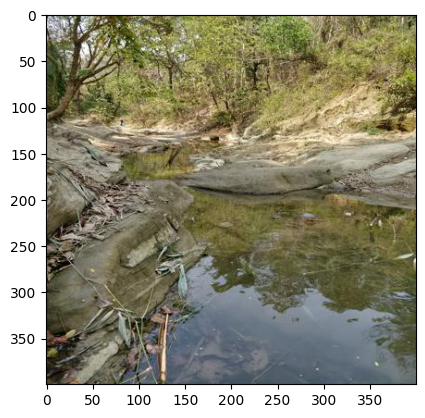

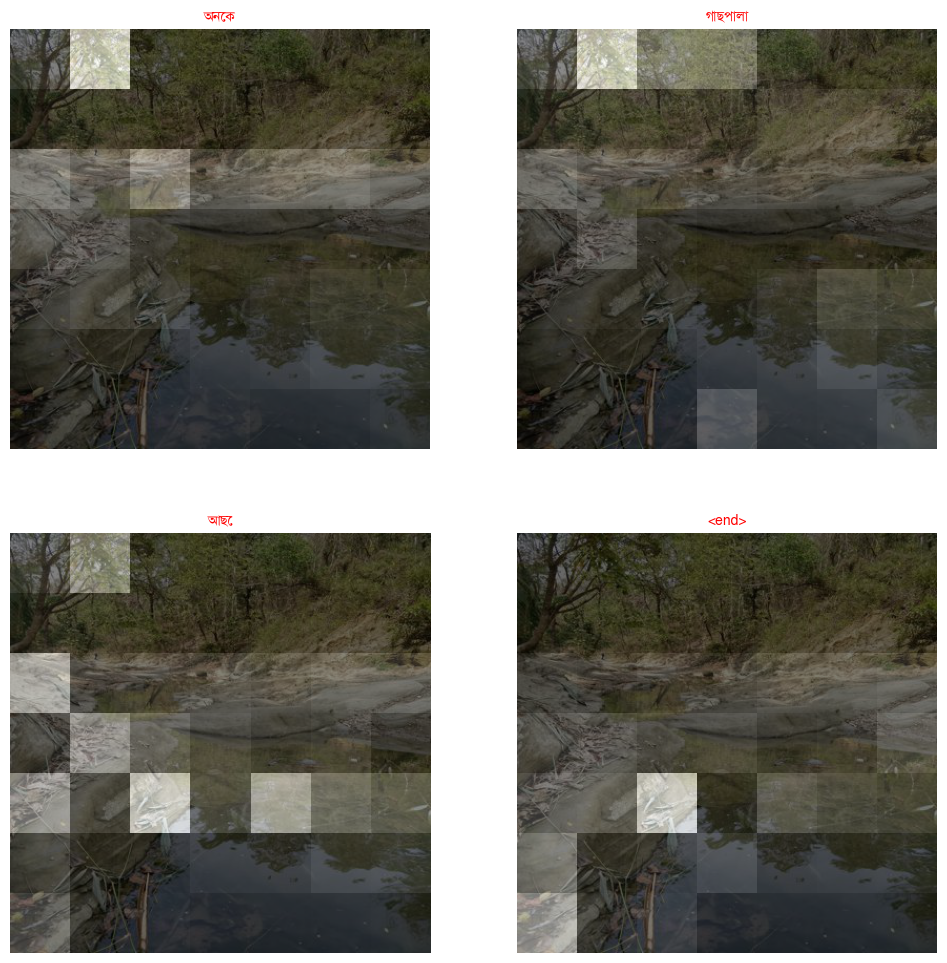

In [101]:
cap_test_data = caption_test.copy()
rid = 101

test_image= path_test[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
result, attention_plot, pred_test = evaluate(test_image)
real_caption=filt_text(real_caption)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)
score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', pred_caption)

plot_attention_map(result, attention_plot, test_image)


In [102]:
len(test_data)

2044

## Evaluation

Real Caption: ['অন্ধকার আকাশ কমলা বর্ণ ধারণ করেছে', 'আকাশে সূর্য দেখা যাচ্ছে', 'সূর্যের কিছু অংশ মেঘ দিয়ে ঢাকা', 'আকাশে সূর্য অস্ত যাচ্ছে', 'আকাশের নিচের অংশ ধুসর বর্ণ ধারন করেছে']
Prediction Caption: সূর্যের কিছু অংশ
BLEU-1: 71.653131
BLEU-2: 71.653131
BLEU-3: 71.653131
BLEU-4: 41.252121
Meteor Score: 0.516569


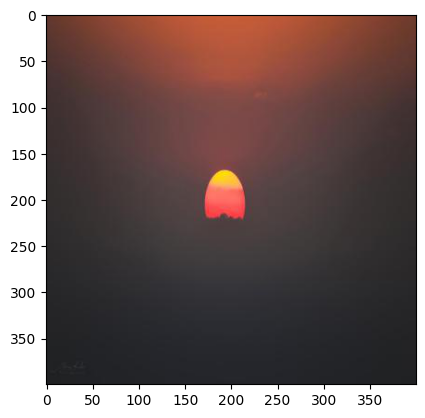

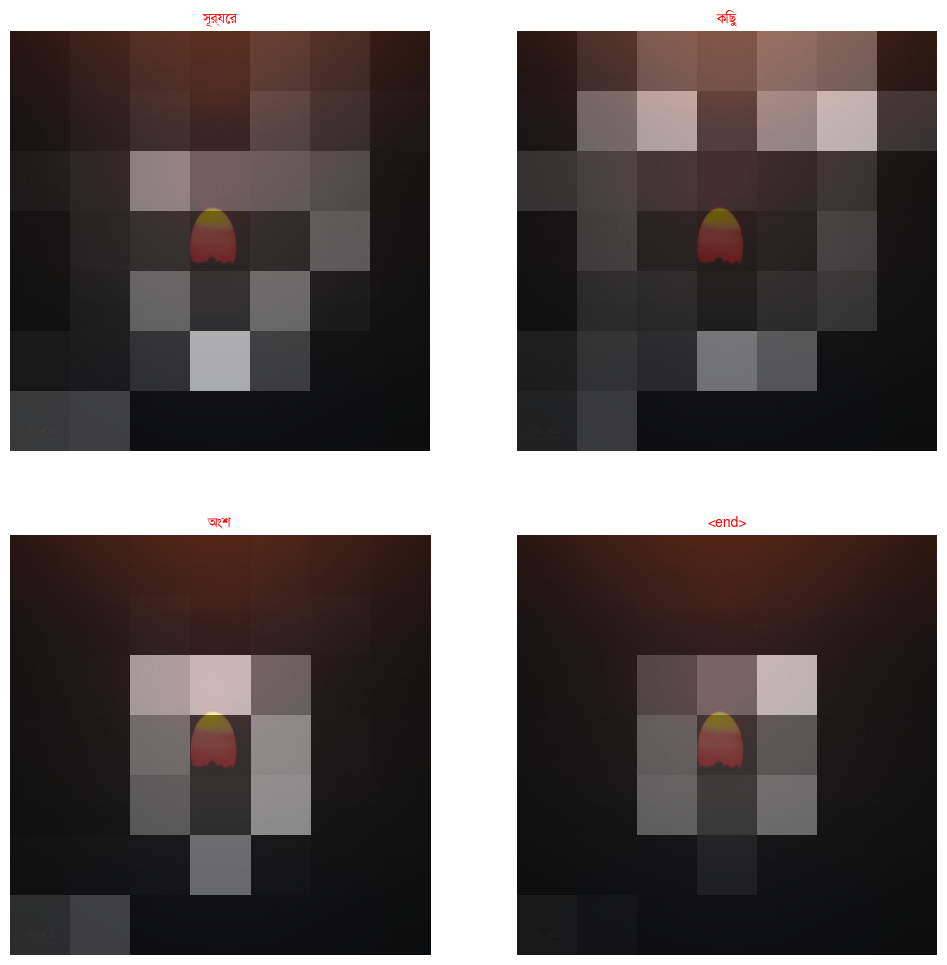

In [103]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['পাহাড়ের চুড়ো থেকে মেঘের ভেসে যাওয়া চোখের সামনে দেখা যাচ্ছে', 'মেঘের ভেসে যাওয়া চোখের সামনে দেখা যাচ্ছে', 'পাহাড়ের চুড়ো থেকে মেঘের ভেসে যাওয়া দেখা যাচ্ছে', 'চোখের সামনে মেঘের ভেসে যাওয়া দেখা যাচ্ছে', 'পাহাড়ের চুড়োয় মেঘের ভেসে যাওয়া']
Prediction Caption: একটি সরু চোখের সামনে ঘর দেখা যাচ্ছে
BLEU-1: 57.142857
BLEU-2: 43.643578
BLEU-3: 17.406200
BLEU-4: 11.587949
Meteor Score: 0.535714


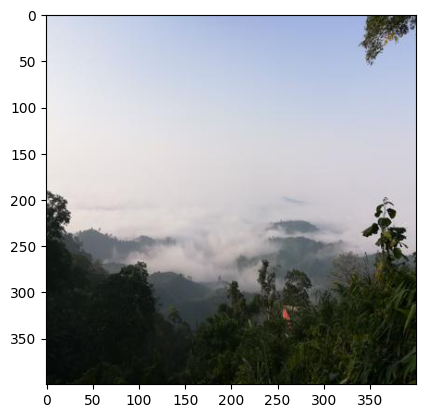

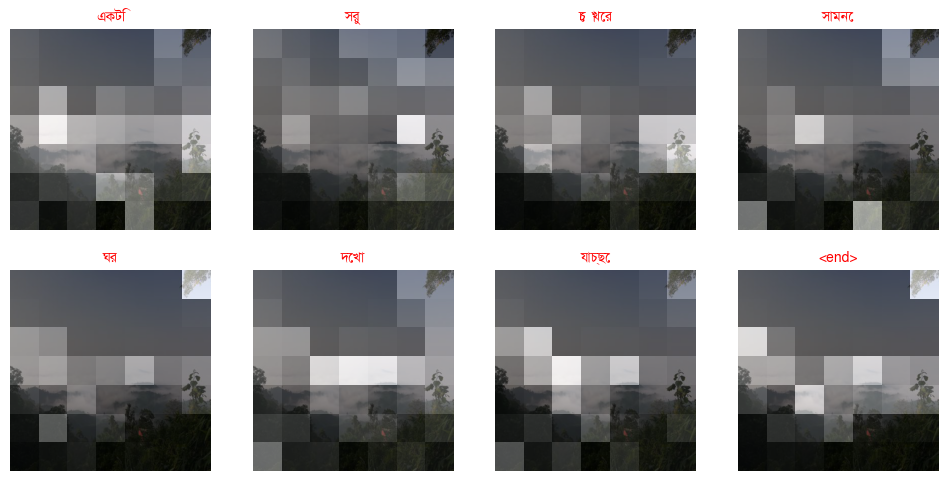

In [104]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['টেবিল এর ওপর প্লেটটিতে ফালুদা আছে', 'বিভিন্ন ফল দিয়া বানানো কিছু খাবার', 'একটি প্লেট এ কিছু খাবার আছে', 'বিভিন্ন ফল দিয়া বানানো কিছু খাবার', 'টেবিল এর ওপর প্লেটটিতে ফালুদা আছে']
Prediction Caption: একটি প্লেট এ কিছু খাবার দেখা যাচ্ছে
BLEU-1: 71.428571
BLEU-2: 69.006556
BLEU-3: 64.801282
BLEU-4: 61.478815
Meteor Score: 0.816393


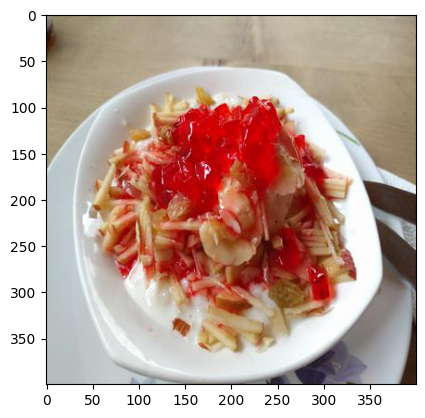

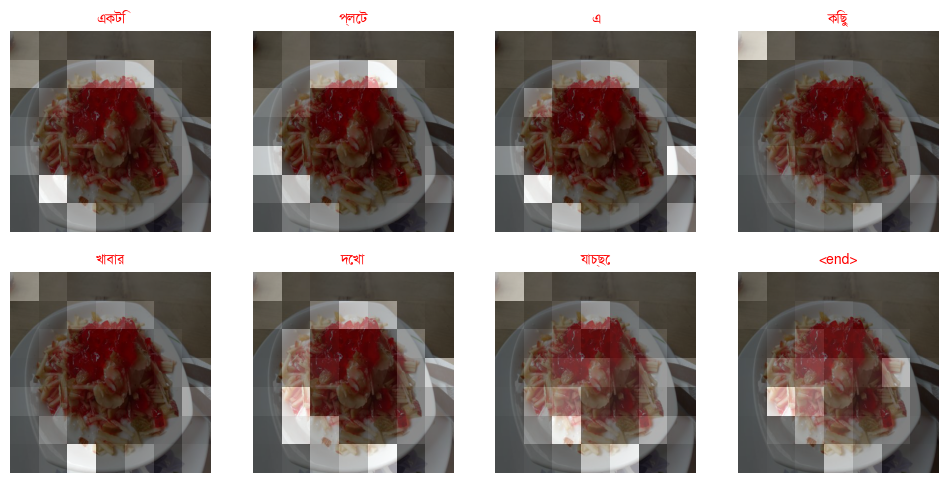

In [105]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কাচের বোতলের ছবি দেখা যাচ্ছে', 'কাচের বোতলের চারপাশে তুষার দেখা যাচ্ছে', 'কাচের বোতলের চারপাশে সাদা তুষার দেখা যাচ্ছে', 'কাচের বোতলের চারপাশে গাছপালা দেখা যাচ্ছে', 'কাচের বোতলের দূরে একটি খুঁটি দেখা যাচ্ছে']
Prediction Caption: কাচের বোতলের চারপাশে গাছপালা দেখা যাচ্ছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.997685


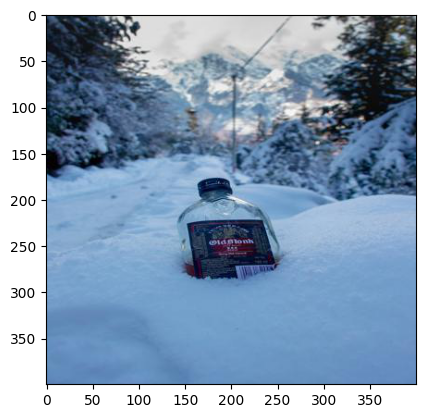

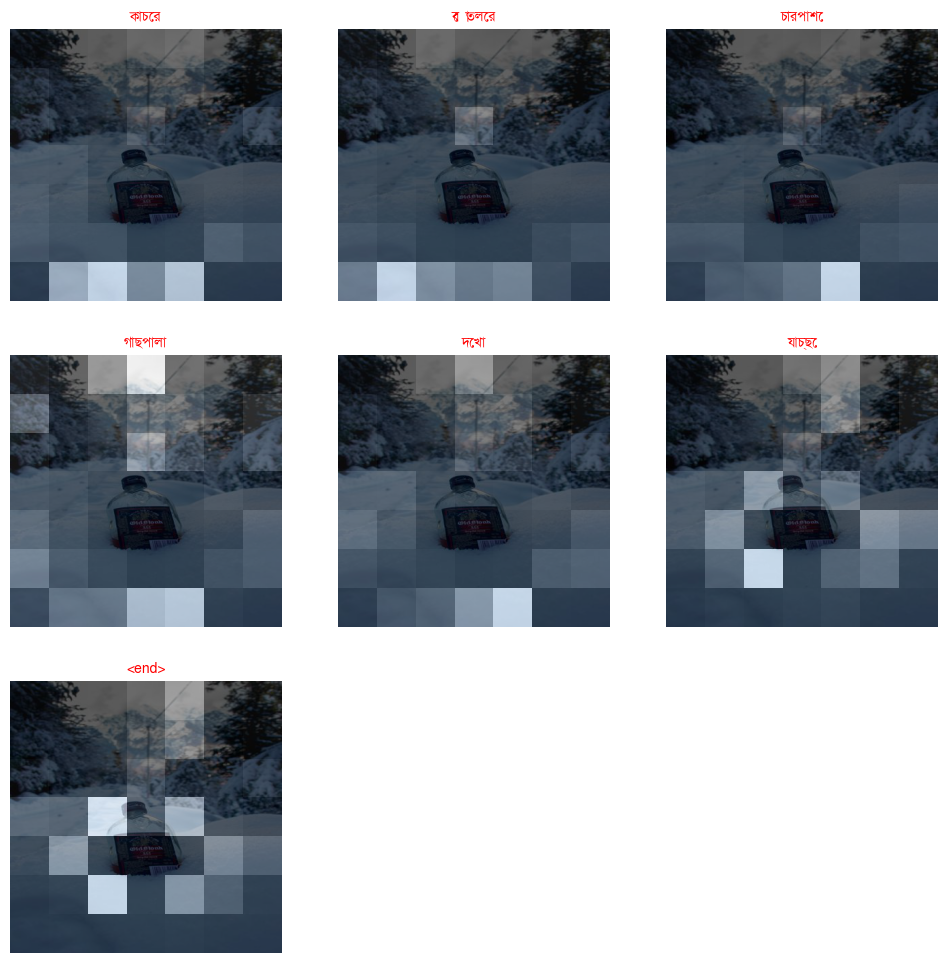

In [106]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['হাস্যজ্জল একটি মেয়ে', 'একটি মেয়ে দাঁড়িয়ে হাসছে', 'বিকেলের স্নিগ্ধ রোদে দাঁড়িয়ে থাকা একটি মেয়ে', 'হাস্যজ্জল মেয়ে দাঁড়িয়ে আছে', 'একটি মেয়ে সবুজ জামা পড়ে দাঁড়িয়ে আছে']
Prediction Caption: একটি মেয়ে
BLEU-1: 60.653066
BLEU-2: 60.653066
BLEU-3: 22.592182
BLEU-4: 13.427897
Meteor Score: 0.646552


ValueError: ignored

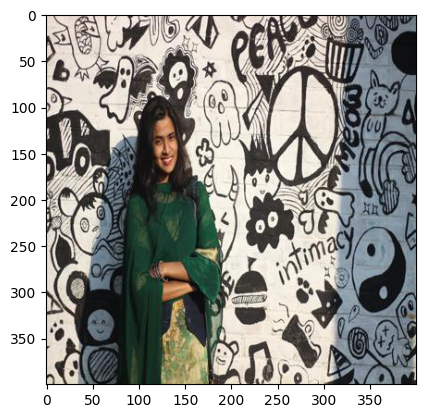

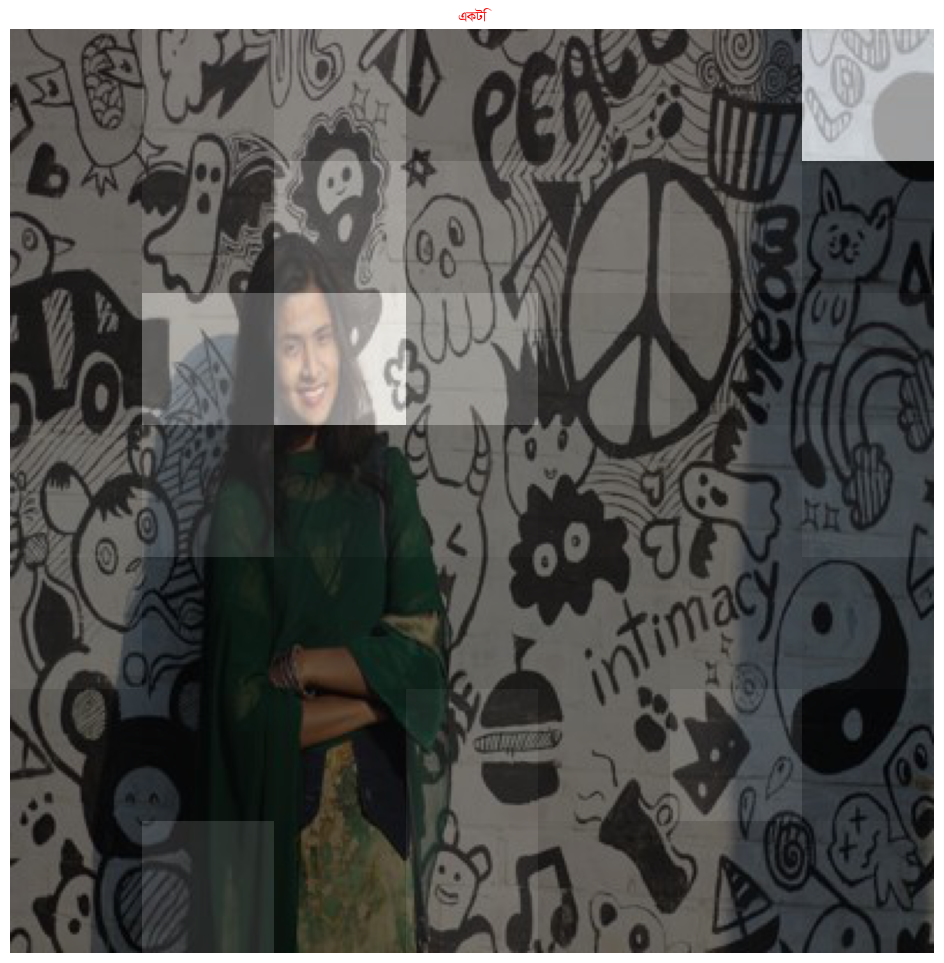

In [107]:
cap_test_data = test_caption.copy()
rid = 100
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কিছু গাছ দৃশ্যমান', 'একটি খেজুর গাছ দৃশ্যমান', 'একটি ছেলে দৃশ্যমান', 'একটি ছেলে গাছে উঠার চেষ্টা করছে', 'একটি পুকুর দৃশ্যমান']
Prediction Caption: একটি ছেলে গাছে কিছু শিশুকে দেখা যাচ্ছে
BLEU-1: 57.142857
BLEU-2: 43.643578
BLEU-3: 31.895435
BLEU-4: 20.748341
Meteor Score: 0.551471


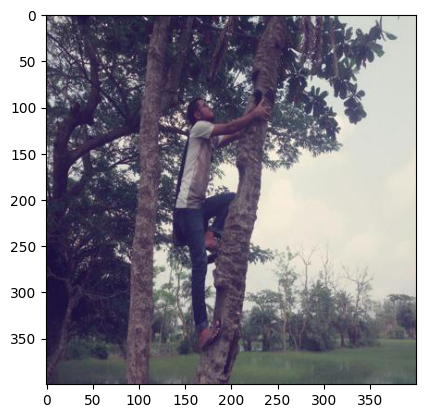

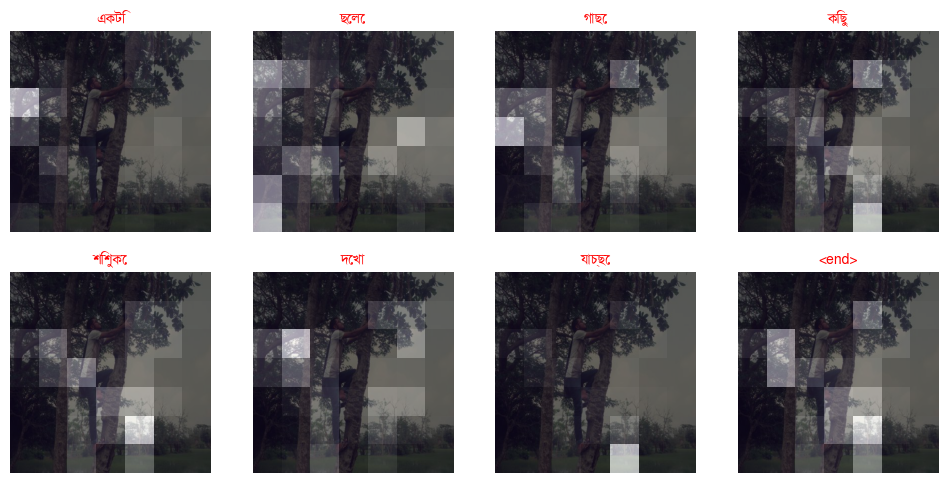

In [108]:
cap_test_data = test_caption.copy()
rid = 435
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি বাটিতে খাবার আছে', 'একটি বাটিতে অনেক ধরনের খাবার আছে', 'প্যানকেক আছে', 'মাশরুম আছে', 'সসেজ আছে']
Prediction Caption: একটি বাটিতে খাবার আছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.992188


ValueError: ignored

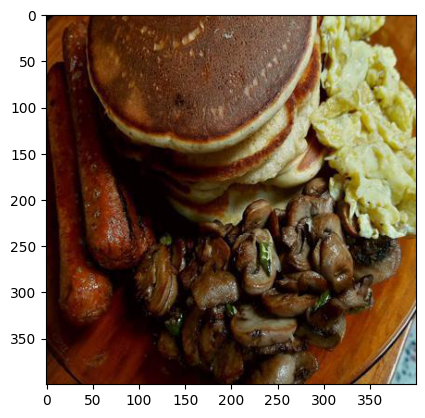

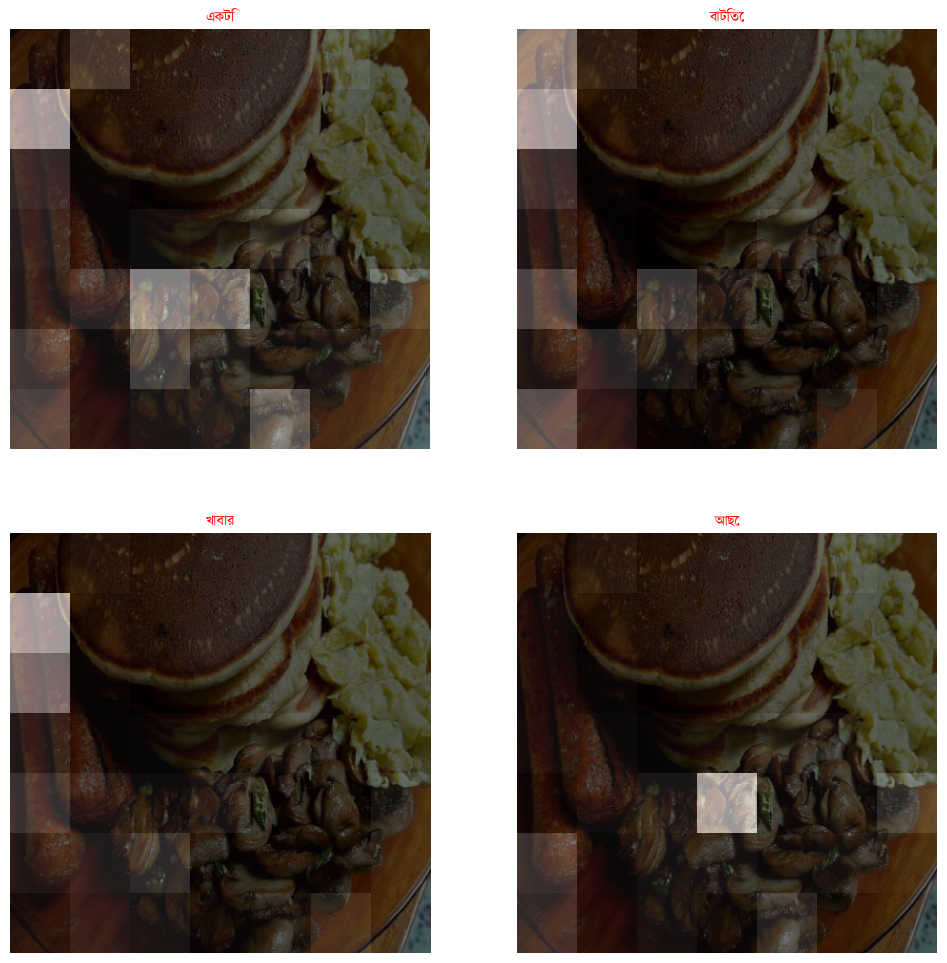

In [109]:
cap_test_data = test_caption.copy()
rid = 311
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি পাহাড় আছে', 'অনেকগুলো গাছ আছে', 'একটি পাহাড়ে অনেক গাছ আছে', 'একটি গাছে অনেক শুকনো পাতা আছে', 'আকাশের নিচে একটি পাহাড় আছে']
Prediction Caption: আকাশের নিচে একটি পাহাড় আছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.996000


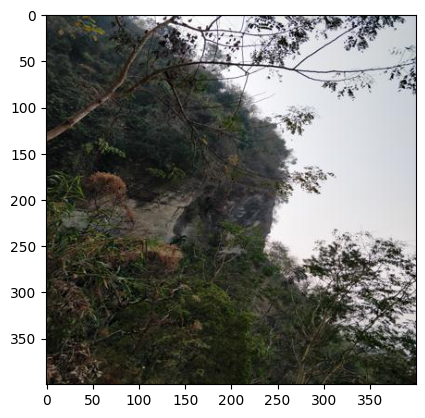

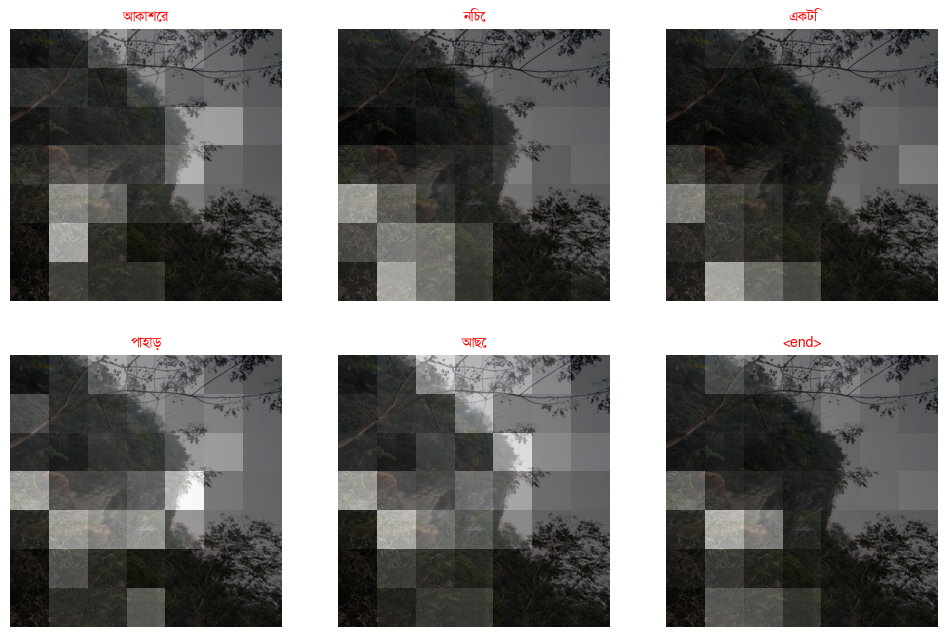

In [110]:
cap_test_data = test_caption.copy()
rid = 161
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি বিড়াল দেখা যাচ্ছে', 'বিড়ালটি সাদা ও কামালা রঙের', 'বিড়ালটি সুয়ে আছে', 'দুটি বড়বড় কান দেখা যাচ্ছে', 'একটি মাঠ দেখা যাচ্ছে']
Prediction Caption: একটি বিড়াল দেখা যাচ্ছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.992188


ValueError: ignored

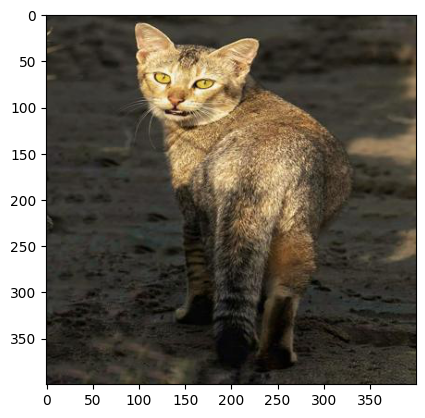

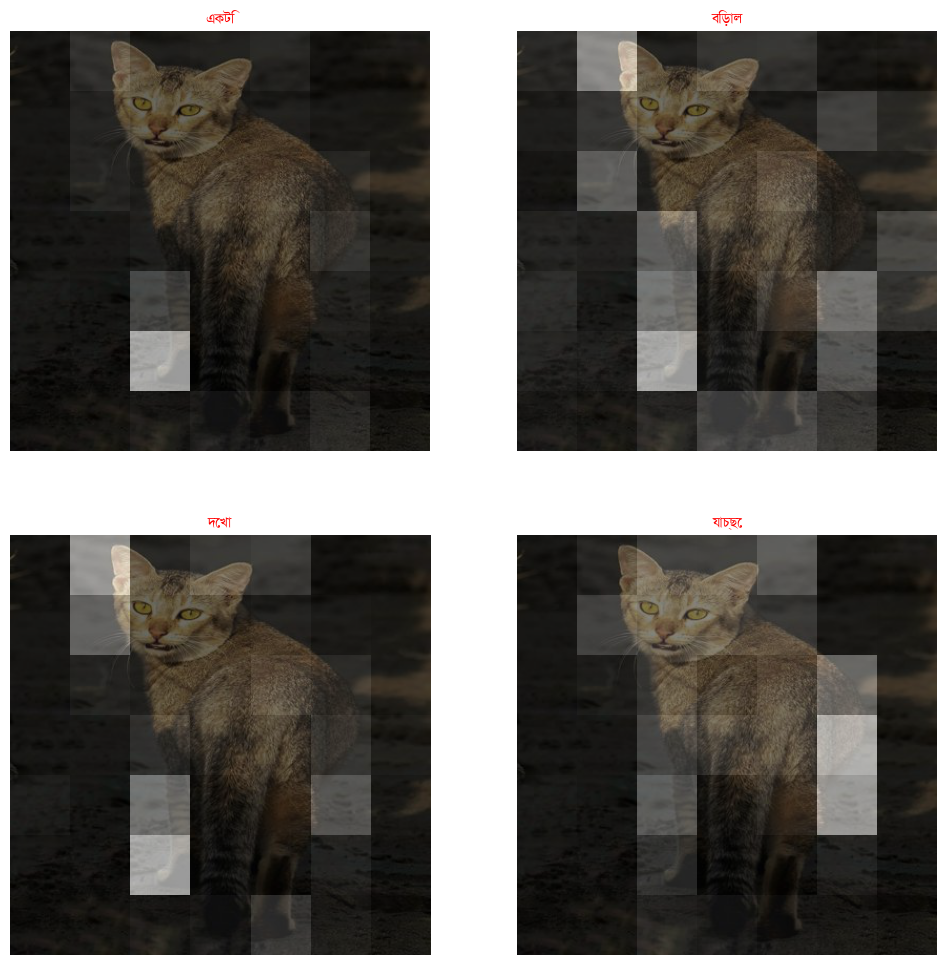

In [111]:
cap_test_data = test_caption.copy()
rid = 235
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কুকুর দেখা যাচ্ছে', 'একটি সাদা রঙের কুকুর দেখা যাচ্ছে', 'একটি সাদা কুকুরকে দেখা যাচ্ছে যেটি মাটিতে গড়াগড়ি খাচ্ছে', 'একটি সাদা কুকুর পোষ মানা অবস্থায় আছে', 'একটি কুকুর মাটিতে গড়াগড়ি খাওয়া অবস্থায় আছে']
Prediction Caption: একটি সাদা কুকুরকে দেখা যাচ্ছে যেটি মাটিতে গড়াগড়ি খাচ্ছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.999314


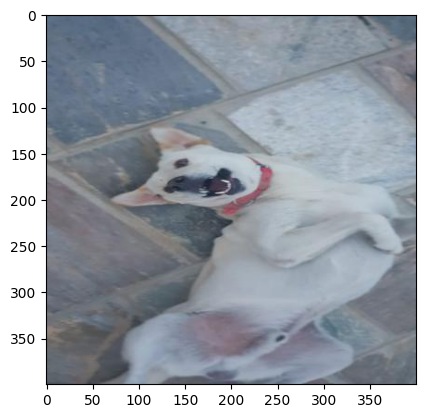

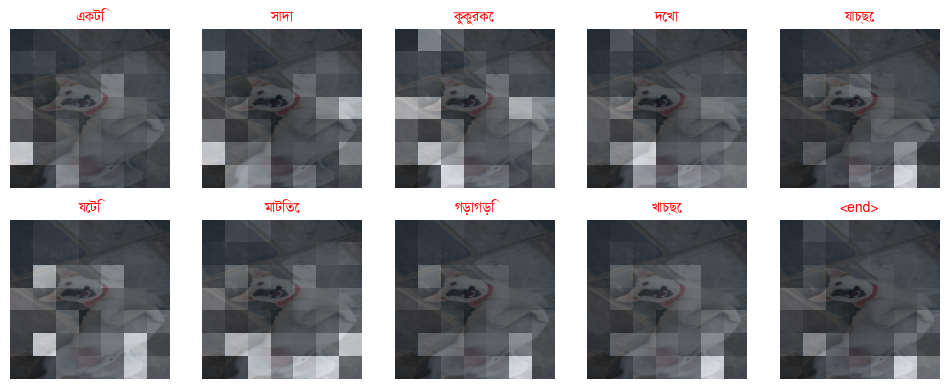

In [112]:
cap_test_data = test_caption.copy()
rid = 700
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)      
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [113]:
b1=[]
b2=[]
b3=[]
b4=[]
m_score = []

for rid in range(0,len(test_data)):
  test_image= test_data[rid]
  real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)   
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1.append(bleu1)
  b2.append(bleu2)
  b3.append(bleu3)
  b4.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score.append(score)

শাড়ি পরা একটি মেয়ে ফুল আছে
কুয়াশাছন্ন একটি ধানক্ষেতের ছবি দেখা যাচ্ছে
একটি কুটীরের ফটক দেখা যাচ্ছে
একটি গাছে দুটি দরজা দেখা যাচ্ছে
মেঘের আকাশের নীচে একজন একাকী রমণী
কিছু সবজি দেখা যাচ্ছে
একটি বাদামি টিকটিকির ছবি দেখা যাচ্ছে
একজনের হাত দেখা যাচ্ছে
একজন পাঞ্জাবি পরা বৃদ্ধ ঘাসের ওপর বসে নামাজ চোখ বন্ধ করে বসে নামাজ চোখ বন্ধ করে বসে নামাজ চোখ বন্ধ করে বসে
সবুজ পাতা রয়েছে
একটি লোক চুপ থাকতে বলছে
একটি কনসার্টের আলোকিত স্টেজ
একটি নৌকা দেখা যাচ্ছে
একজন লোক লাল জামা পরে বসে আছে
একটি টেবিল এ দুইজনের খাবার দেখা যাচ্ছে
অনেক ঘাসের উপর শিশির আছ এবং দূরে কিছু গাছপালা আছে
লোকটি নদীতে পা ভিজিয়েছে
একটি ট্রেনের ছাদের সাথে কিছু বালতি বাধা
একটি বাকা রাস্তা দেখা যাচ্ছে
বাটিতে মাংসের পাশে কিছু খাবার দেখা যাচ্ছে
খাগড়াছড়ির জনপ্রিয় পর্যটন কেন্দ্র আলুটিলা পর্যটন কেন্দ্রের প্রবেশ দরজা দেখা যাচ্ছে
পাহাড় পর্বত আছে
খাঁচায় একটি পাখি রয়েছে
একটি শিশু বসে আছে
একজন পুরুষ একজন লোকের চালাচ্ছে
সমুদ্রে কিছু জাহাজ দেখা যাচ্ছে
একটি প্রজাপতি
দূরে কিছু গাছপালা আছে
একটি কালো চশমা
একটি গাছে কিছু লাল রঙেরও একটি পাতা দেখা যাচ্ছে
ফ

In [114]:
print('BLEU-1: %f' % np.mean(b1))
print('BLEU-2: %f' % np.mean(b2))
print('BLEU-3: %f' % np.mean(b3))
print('BLEU-4: %f' % np.mean(b4))

BLEU-1: 85.440662
BLEU-2: 80.183563
BLEU-3: 73.677956
BLEU-4: 66.075268


In [117]:
print('Meteor Score of Attention+BiGRU: %f' % np.mean(m_score))

Meteor Score of Attention+BiGRU: 0.805272
